<a href="https://colab.research.google.com/github/xxshreyaxx/uber-heatmap/blob/main/ustheatmaps.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [20]:
import pandas as pd
import folium
from folium.plugins import HeatMap

# Load the Uber pickups dataset
data = pd.read_csv('/content/uber-raw-data-jul14.csv')

# Create a map centered on New York City
map_nyc = folium.Map(location=[40.7128, -74.0060], zoom_start=11)

# Create a HeatMap layer using the pickup coordinates
heat_data = data[['Lat', 'Lon']].values
HeatMap(heat_data).add_to(map_nyc)


display(map_nyc)
map_nyc.save('heatmap.html')



In [29]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


In [25]:
data = pd.read_csv('https://raw.githubusercontent.com/faspy/raw_data/main/trips_data.csv')


In [27]:
print(data.columns)


Index(['City', 'Product Type', 'Trip or Order Status', 'Request Time',
       'Begin Trip Time', 'Begin Trip Lat', 'Begin Trip Lng', 'Dropoff Time',
       'Dropoff Lat', 'Dropoff Lng', 'Distance (miles)', 'Fare Amount',
       'Fare Currency'],
      dtype='object')


<ipython-input-31-d8c8722d0ba3>:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=longitude, y=latitude, cmap='hot', shade=True)


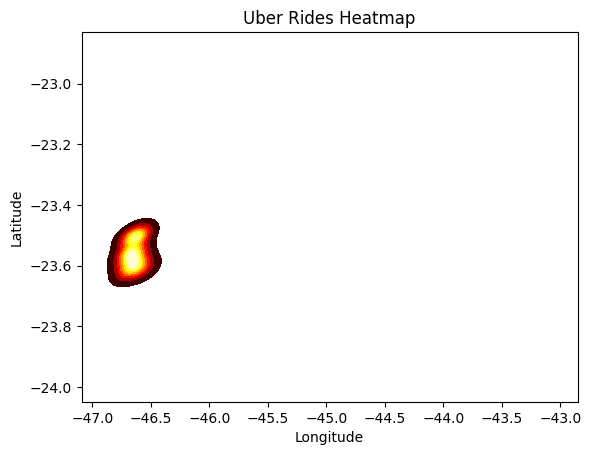

In [31]:
latitude = data['Begin Trip Lat']
longitude = data['Begin Trip Lng']

sns.kdeplot(x=longitude, y=latitude, cmap='hot', shade=True)

# Set the plot title and labels
plt.title('Uber Rides Heatmap')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Display the heatmap
plt.show()

In [34]:
import pandas as pd
import folium
from folium.plugins import HeatMap

# Load the dataset
data = pd.read_csv('https://raw.githubusercontent.com/faspy/raw_data/main/trips_data.csv')

# Filter out rows with missing values in latitude and longitude columns
data = data.dropna(subset=['Begin Trip Lat', 'Begin Trip Lng'])

# Extract latitude and longitude columns
locations = data[['Begin Trip Lat', 'Begin Trip Lng']]

# Create a map centered on the mean coordinates
map_heatmap = folium.Map(location=[locations['Begin Trip Lat'].mean(), locations['Begin Trip Lng'].mean()], zoom_start=12)

# Create a HeatMap layer using the coordinates
HeatMap(locations).add_to(map_heatmap)

# Display the map
map_heatmap


In [15]:
import pandas as pd
import folium
from folium.plugins import HeatMap
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as colors

# Load the dataset
data = pd.read_csv('https://raw.githubusercontent.com/faspy/raw_data/main/trips_data.csv')

# Filter out rows with missing values in latitude and longitude columns
data = data.dropna(subset=['Begin Trip Lat', 'Begin Trip Lng'])

# Extract latitude and longitude columns
locations = data[['Begin Trip Lat', 'Begin Trip Lng']]

# Create a custom colormap
cmap = plt.cm.get_cmap('RdYlBu_r')

# Normalize the colormap to [0, 1]
normalize = colors.Normalize(vmin=0, vmax=1)

# Create a color palette from the colormap
color_palette = [colors.rgb2hex(cmap(normalize(i))) for i in range(256)]

# Create a map centered on the mean coordinates
map_heatmap = folium.Map(location=[locations['Begin Trip Lat'].mean(), locations['Begin Trip Lng'].mean()], zoom_start=12)

# Create a HeatMap layer using the coordinates and custom colormap
HeatMap(locations, gradient={0.0: color_palette[0], 0.5: color_palette[128], 1.0: color_palette[255]}).add_to(map_heatmap)

# Display the map
map_heatmap




<ipython-input-15-4e2041b84bf1>:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('RdYlBu_r')


In [19]:
import pandas as pd
import folium
from folium.plugins import HeatMap
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as colors

# Load the dataset
data = pd.read_csv('https://raw.githubusercontent.com/faspy/raw_data/main/trips_data.csv')

# Filter out rows with missing values in latitude and longitude columns
data = data.dropna(subset=['Begin Trip Lat', 'Begin Trip Lng'])

# Extract latitude and longitude columns
locations = data[['Begin Trip Lat', 'Begin Trip Lng']]

# Create a custom colormap
colors_list = ['#FFFFB2', '#FECC5C', '#FD8D3C', '#F03B20', '#BD0026']  # Adjust color intensity here

# Create a map centered on the mean coordinates
map_heatmap = folium.Map(location=[locations['Begin Trip Lat'].mean(), locations['Begin Trip Lng'].mean()], zoom_start=12)

# Create a HeatMap layer using the coordinates and custom colormap
HeatMap(locations, gradient={0.0: colors_list[0], 1.0: colors_list[-1]}, min_opacity=0.4, radius=15, blur=10).add_to(map_heatmap)

# Display the map
map_heatmap


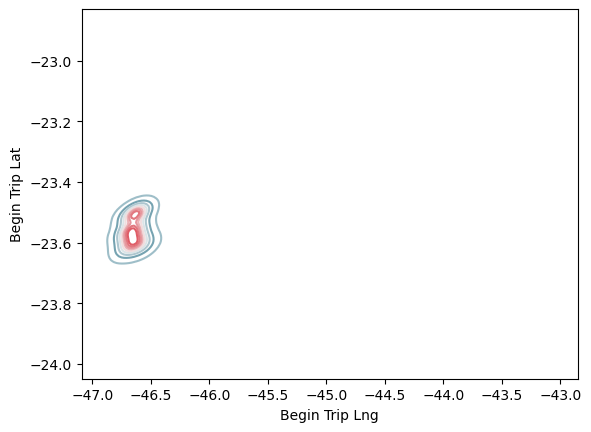

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Read the CSV data from the URL
url = 'https://raw.githubusercontent.com/faspy/raw_data/main/trips_data.csv'
data = pd.read_csv(url)

# Extract latitude and longitude columns from the data
lat = data['Begin Trip Lat']
lon = data['Begin Trip Lng']

# Create a custom colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Generate the heatmap with the custom colormap
heatmap = sns.kdeplot(x=lon, y=lat, cmap=cmap)

# Set the intensity of the deepest red color
heatmap.collections[0].set_alpha(0.5)

# Show the heatmap
plt.show()
